In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')

zip_file_path = '/content/drive/MyDrive/panorama_dataset.zip'

extract_dir = '/content/panorama_data'


os.makedirs(extract_dir, exist_ok=True)



!unzip -q "{zip_file_path}" -d "{extract_dir}"


Mounted at /content/drive
Unzipping dataset... this might take a minute.


In [ ]:
dataset_path = '/content/panorama_data/'

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from sklearn.cluster import KMeans

def show_image(img, title="Image", cmap_type="gray", figsize=(10,5)):
    plt.figure(figsize=figsize)
    if len(img.shape) == 3 and cmap_type == "gray":
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(img, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
import os
import glob
import numpy as np
import cv2
from sklearn.cluster import KMeans

imgs = []
for ext in ('*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG'):
    imgs.extend(glob.glob(os.path.join(dataset_path, '**', ext), recursive=True))

if len(imgs) == 0:
    print("no images found")
    exit()

def get_hist(path):
    img = cv2.imread(path)
    if img is None:
        return np.zeros((512,))

    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv], [0, 1, 2], None, [8, 8, 8], [0, 180, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

features = []
for p in imgs:
    features.append(get_hist(p))

features = np.array(features)

kmeans = KMeans(n_clusters=3, random_state=2023471)
labels = kmeans.fit_predict(features)

image_sets = {0: [], 1: [], 2: []}
for i in range(len(imgs)):
    image_sets[labels[i]].append(imgs[i])

print({k: len(v) for k, v in image_sets.items()})

{0: 8, 1: 8, 2: 8}


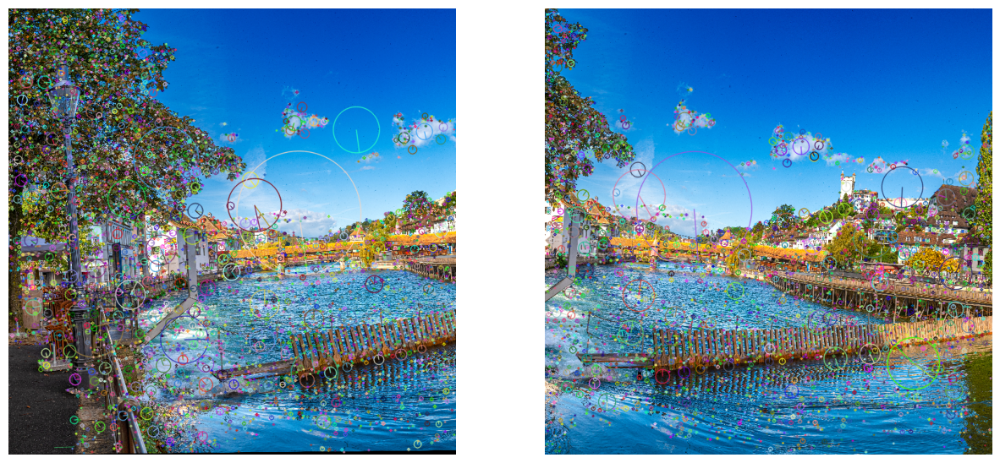

In [ ]:
import cv2
import matplotlib.pyplot as plt

path1 = '/content/panorama_data/panorama_dataset/image1.png'
path2 = '/content/panorama_data/panorama_dataset/image2.png'

img1 = cv2.imread(path1)
img2 = cv2.imread(path2)

if img1 is None or img2 is None:
    print("images not found")
    exit()

g1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
g2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create()

k1, d1 = sift.detectAndCompute(g1, None)
k2, d2 = sift.detectAndCompute(g2, None)

out1 = cv2.drawKeypoints(img1, k1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
out2 = cv2.drawKeypoints(img2, k2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(cv2.cvtColor(out1, cv2.COLOR_BGR2RGB))
ax1.axis('off')
ax2.imshow(cv2.cvtColor(out2, cv2.COLOR_BGR2RGB))
ax2.axis('off')

plt.show()

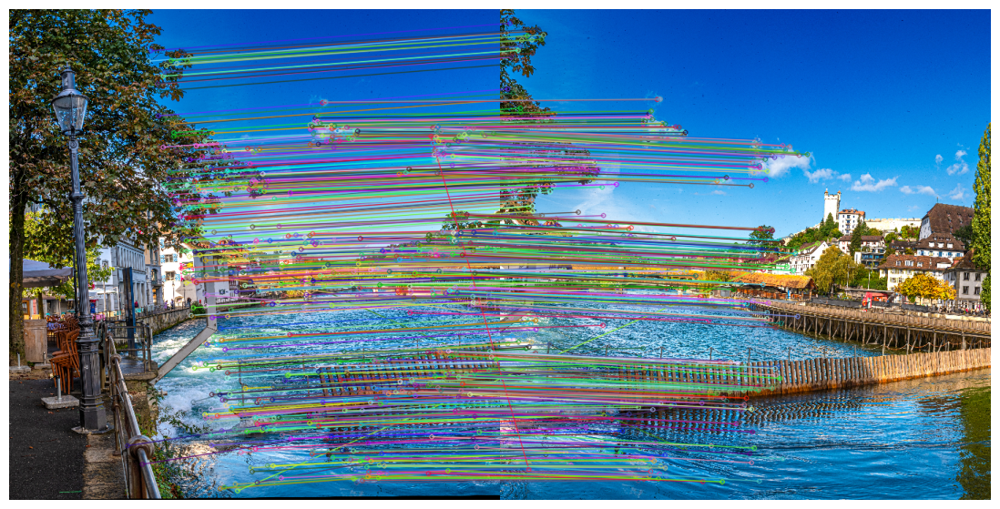

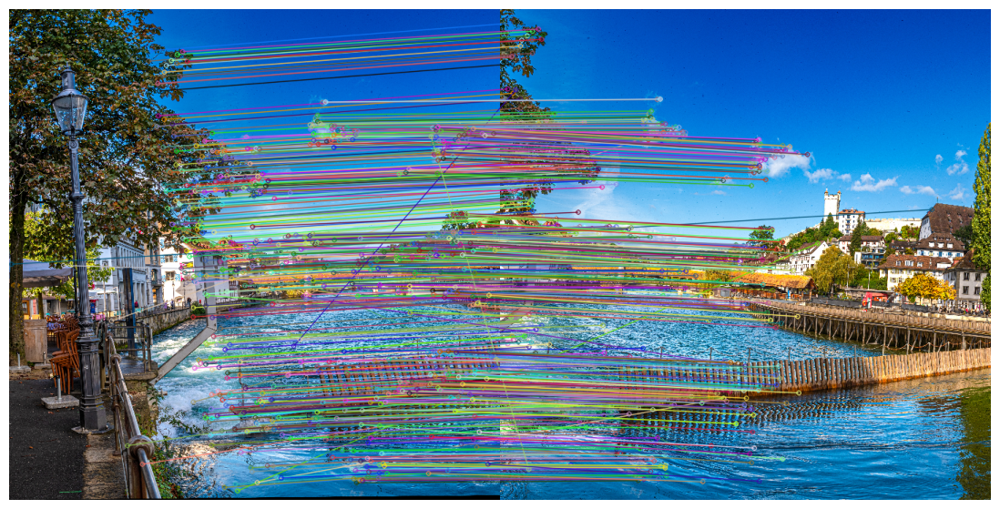

In [ ]:
import cv2
import matplotlib.pyplot as plt

if d1 is None or d2 is None:
    print("descriptors not found")
    exit()

bf = cv2.BFMatcher()
bf_raw = bf.knnMatch(d1, d2, k=2)

good_bf = []
for m, n in bf_raw:
    if m.distance < 0.75 * n.distance:
        good_bf.append([m])

out_bf = cv2.drawMatchesKnn(img1, k1, img2, k2, good_bf, None, flags=2)

plt.figure(figsize=(15, 7))
plt.imshow(cv2.cvtColor(out_bf, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

index_params = dict(algorithm=1, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)
flann_raw = flann.knnMatch(d1, d2, k=2)

good_flann =[]
for m, n in flann_raw:
    if m.distance < 0.75*n.distance:
        good_flann.append(m)

out_flann = cv2.drawMatches(img1, k1, img2, k2, good_flann, None, flags=2)

plt.figure(figsize=(15, 7))
plt.imshow(cv2.cvtColor(out_flann, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [ ]:
MIN_MATCH_COUNT = 10

if len(good_flann)>MIN_MATCH_COUNT:
    src_pts = []
    for m in good_flann:
        src_pts.append(k1[m.queryIdx].pt)
    src_pts = np.float32(src_pts).reshape(-1, 1, 2)

    dst_pts = []
    for m in good_flann:
        dst_pts.append(k2[m.trainIdx].pt)
    dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

    np.savetxt("homography.csv", H, delimiter=",")
    print(H)
else:
    print(f"not enough matches found ")

[[ 1.08921331e+00  1.44209455e-01  1.89184385e+02]
 [-1.57417200e-01  9.88461483e-01  4.27347020e+01]
 [ 4.66890895e-08 -3.97566029e-07  1.00000000e+00]]


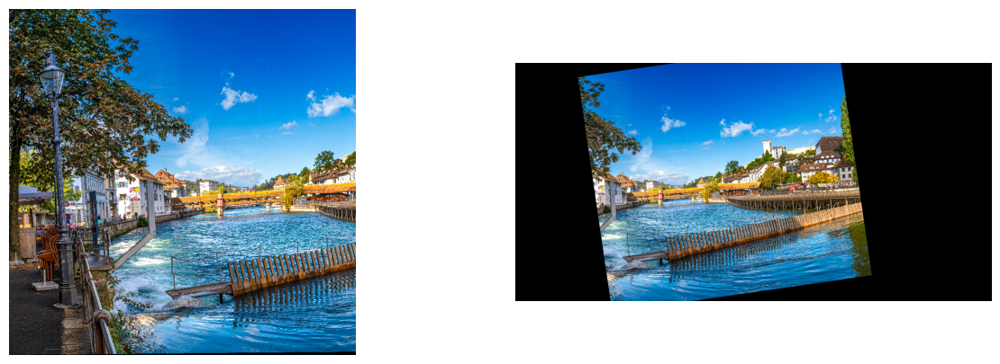

In [ ]:
import cv2
import matplotlib.pyplot as plt

h1,w1 = img1.shape[:2]
h2,w2 = img2.shape[:2]

warped_img2 = cv2.warpPerspective(img2,H,(w1+w2,h1))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
ax1.axis('off')
ax2.imshow(cv2.cvtColor(warped_img2, cv2.COLOR_BGR2RGB))
ax2.axis('off')

plt.show()

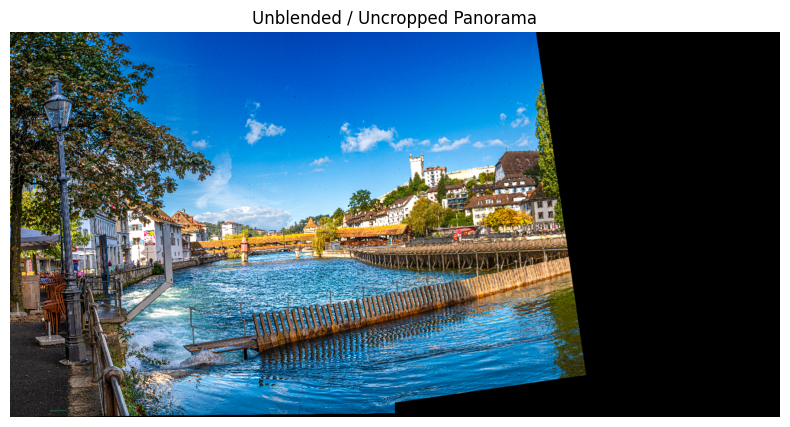

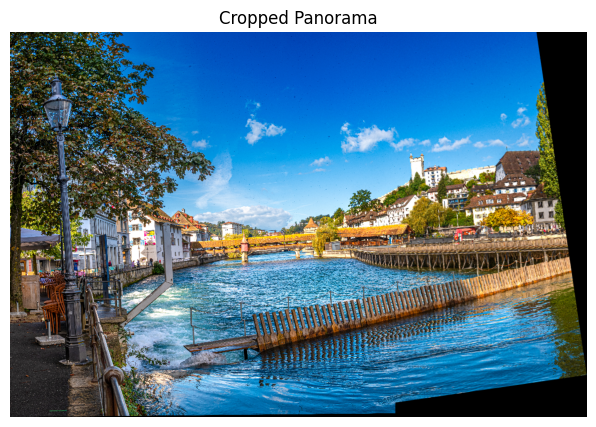

In [ ]:
panorama_unblended = warped_img2.copy()
panorama_unblended[0:h1, 0:w1] = img1

show_image(panorama_unblended, "Unblended / Uncropped Panorama")

def crop_black_borders(img):
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        cropped = img[y:y+h, x:x+w]
        return cropped

    return img


panorama_cropped = crop_black_borders(panorama_unblended)
show_image(panorama_cropped, "Cropped Panorama")

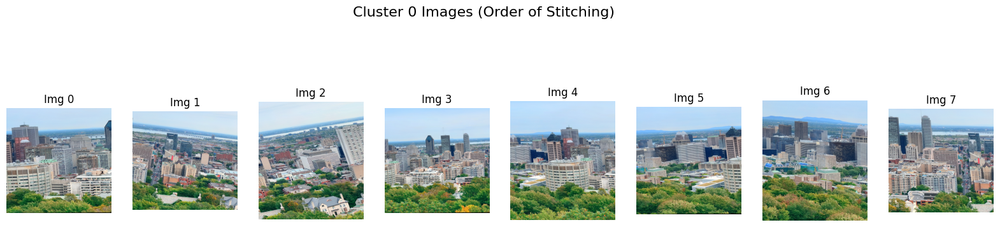

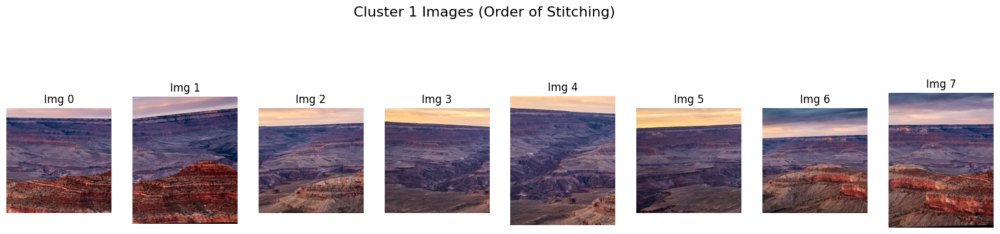

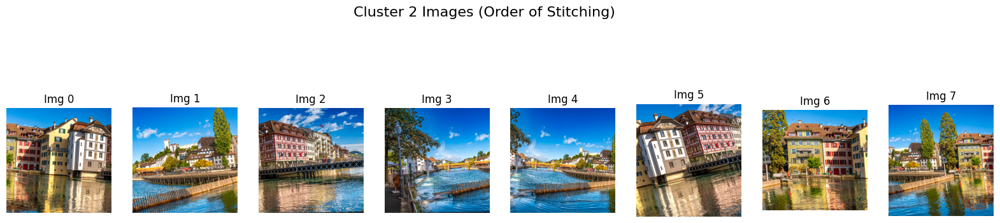

In [ ]:
for cluster_id in range(3):
    paths = image_sets[cluster_id]
    plt.figure(figsize=(20, 5))
    plt.suptitle(f"cluster {cluster_id} Images (Order of Stitching)", fontsize=16)
    for i, path in enumerate(paths):
        img = cv2.imread(path)
        plt.subplot(1, len(paths), i + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Img {i}")
        plt.axis('off')
    plt.show()

Running Step 6
cluster 0


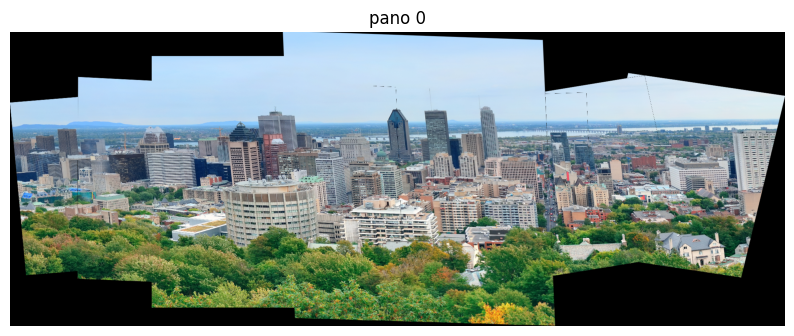

cluster 1


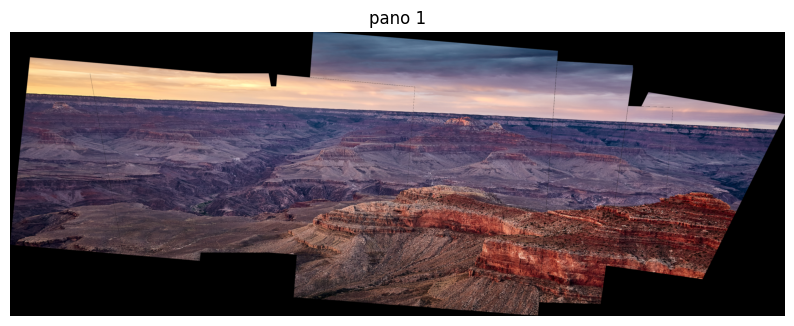

cluster 2


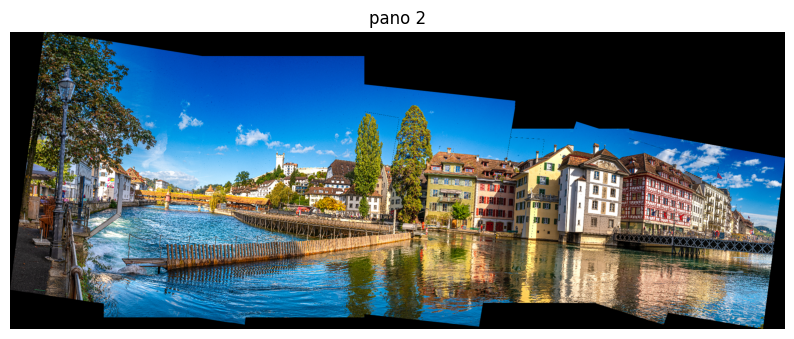

In [ ]:
import numpy as np
import cv2


def stitch_two(img1, img2):
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    sift = cv2.SIFT_create()
    k1, d1 = sift.detectAndCompute(gray1, None)
    k2, d2 = sift.detectAndCompute(gray2, None)

    if d1 is None or d2 is None:
        return None

    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))
    matches = flann.knnMatch(d2, d1, k=2)

    good = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good.append(m)

    if len(good) < 20:
        return None

    src_pts = np.float32([k2[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([k1[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    if H is None or abs(np.linalg.det(H[0:2, 0:2])) < 0.1:
        return None

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    p1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    p2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    p2_trans = cv2.perspectiveTransform(p2, H)

    pts = np.concatenate((p1, p2_trans), axis=0)
    mins = np.int32(pts.min(axis=0).ravel() - 0.5)
    maxs = np.int32(pts.max(axis=0).ravel() + 0.5)

    xmin = mins[0]
    ymin = mins[1]
    xmax = maxs[0]
    ymax = maxs[1]

    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])

    res = cv2.warpPerspective(img2, Ht.dot(H), (xmax - xmin, ymax - ymin))

    y1, y2 = t[1], h1 + t[1]
    x1, x2 = t[0], w1 + t[0]

    roi = res[y1:y2, x1:x2]

    g1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    _, msk = cv2.threshold(g1, 1, 255, cv2.THRESH_BINARY)
    msk_inv = cv2.bitwise_not(msk)

    bg = cv2.bitwise_and(roi, roi, mask=msk_inv)
    fg = cv2.bitwise_and(img1, img1, mask=msk)

    res[y1:y2, x1:x2] = cv2.add(bg, fg)

    return res

def stitch_all(paths):
    lst = paths.copy()
    mid = len(lst) // 2
    base = cv2.imread(lst.pop(mid))

    sift = cv2.SIFT_create()
    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))

    while len(lst) > 0:
        best_img = None
        best_idx = -1
        max_m = 0

        g_base = cv2.cvtColor(base, cv2.COLOR_BGR2GRAY)
        k_base, d_base = sift.detectAndCompute(g_base, None)

        if d_base is None:
            break

        for i in range(len(lst)):
            img = cv2.imread(lst[i])
            g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            k, d = sift.detectAndCompute(g, None)

            if d is not None:
                try:
                    mats = flann.knnMatch(d, d_base, k=2)
                    gds = []
                    for m, n in mats:
                        if m.distance < 0.7 * n.distance:
                            gds.append(m)

                    if len(gds) > max_m:
                        max_m = len(gds)
                        best_idx = i
                        best_img = img
                except:
                    pass

        if max_m >= 20 and best_img is not None:

            new_b = stitch_two(base,best_img)
            if new_b is not None:
                base = new_b
            lst.pop(best_idx)
        else:
            break

    return crop_black_borders(base)

for i in range(3):
    print("cluster", i)
    pano = stitch_all(image_sets[i])
    show_image(pano, "pano " + str(i))